In [36]:
import numpy as np
from os import mkdir
from os.path import join, sep,exists
import glob
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy import stats
from scipy.ndimage.filters import median_filter
from scipy.ndimage.interpolation import shift
%matplotlib inline

/tmp/ipykernel_12255/1092928507.py:8: DeprecationWarning: Please import `median_filter` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.filters import median_filter
/tmp/ipykernel_12255/1092928507.py:9: DeprecationWarning: Please import `shift` from the `scipy.ndimage` namespace; the `scipy.ndimage.interpolation` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.interpolation import shift


### Setting Directories and Identifying Files

In [37]:
# Set up paths 
frameSize = 351
band = 'L'
tg_name= '2M1207'
useRefFrames = False
path_input = './2M1207_bands/Lband/'
path_output = path_input + 'out/'
sep='/'
print(path_input)

path_flats = path_input+'flats'+sep
path_flats_darks = path_input+'flats/darks'+sep
path_sci = path_input+'sci'+sep
path_darks = path_input+'darks'+sep

# File list
filelist_flats = glob.glob(path_flats+'*.fits')
filelist_flats_darks = glob.glob(path_flats_darks+'*.fits')
filelist_sci = sorted(glob.glob(path_sci+'*.fits'))
filelist_darks = glob.glob(path_darks+'*.fits')

print("Number of flat fields: ",len(filelist_flats))
print("Number of darks for flat fields: ",len(filelist_flats_darks))
print("Number of science images: ",len(filelist_sci))
print("Number of darks for science images: ",len(filelist_darks))

./2M1207_bands/Lband/
Number of flat fields:  15
Number of darks for flat fields:  3
Number of science images:  39
Number of darks for science images:  3


### Raw Science Image

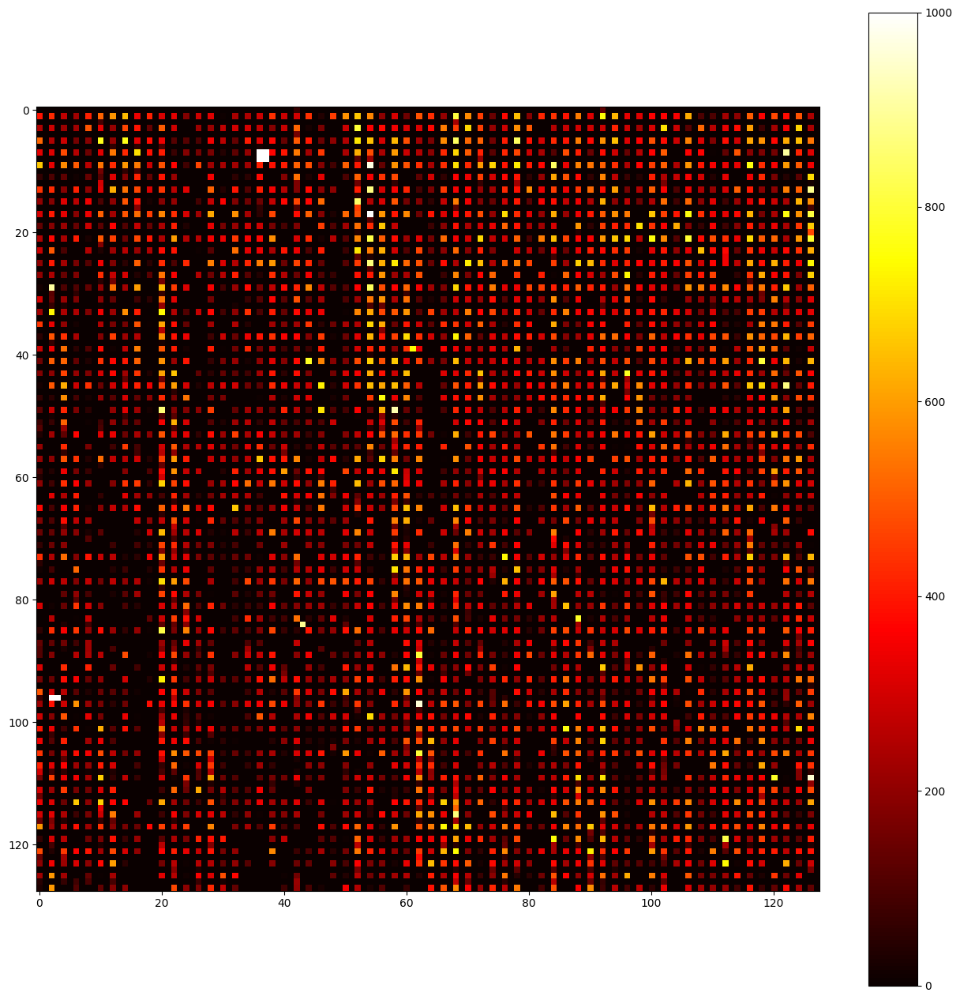

In [38]:
raw_sci = fits.open(filelist_sci[0])[0].data
crop = 128
dimx = raw_sci.shape[0]
dimy = raw_sci.shape[1]
x1 = int((dimx - crop)/2)
x2 = int(x1 + crop)
y1 = int((dimy - crop)/2)
y2 = int(y1 + crop)
raw_sci = shift(raw_sci,[-100,-100])
raw_cropped = raw_sci[x1:x2,y1:y2]
raw_cropped.shape
plt.figure(figsize=(16,16))
#plt.imshow(raw_cropped,vmin=0,vmax=200,cmap='hot') # see image of source
#plt.imshow(raw_cropped,vmin=0,vmax=100,cmap='hot') # see dead pixels and bright sky background
plt.imshow(raw_cropped,vmin=0,vmax=1000,cmap='hot') # see hot pixels
plt.colorbar()

### Median Flat-Dark

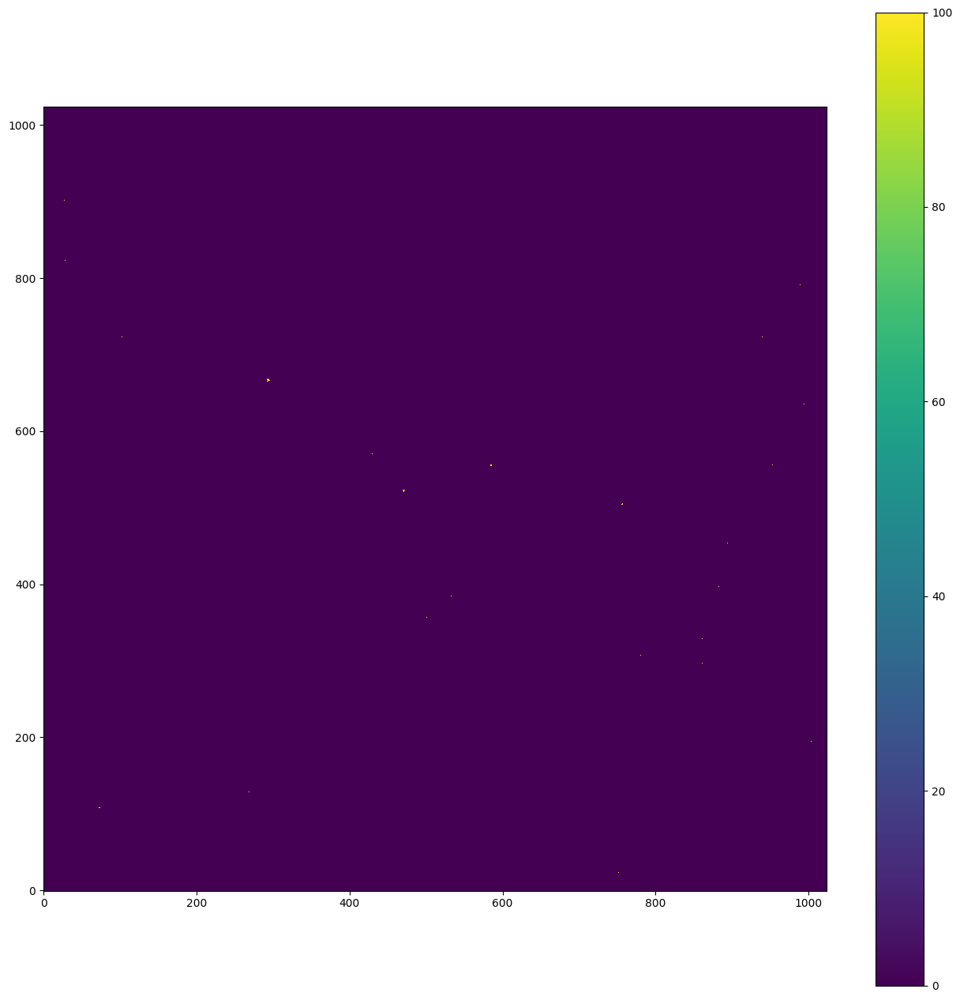

In [39]:
flats_darks_cube_tmp=[]
for filename in filelist_flats_darks:
    dummy = fits.open(filename)[0].data
    flats_darks_cube_tmp.append(dummy)
    
flats_darks_cube = np.array(flats_darks_cube_tmp)
masterflats_darks = np.median(flats_darks_cube,axis=0)
plt.figure(figsize=(16,16))
#plt.imshow(masterflats_darks,vmin=0,vmax=10) # show median dark frame
plt.imshow(masterflats_darks,vmin=0,vmax=100,origin ='lower') # shows grid-like structure and extra noise at corners (heat from electronics)
plt.colorbar()

### Median Master Flat

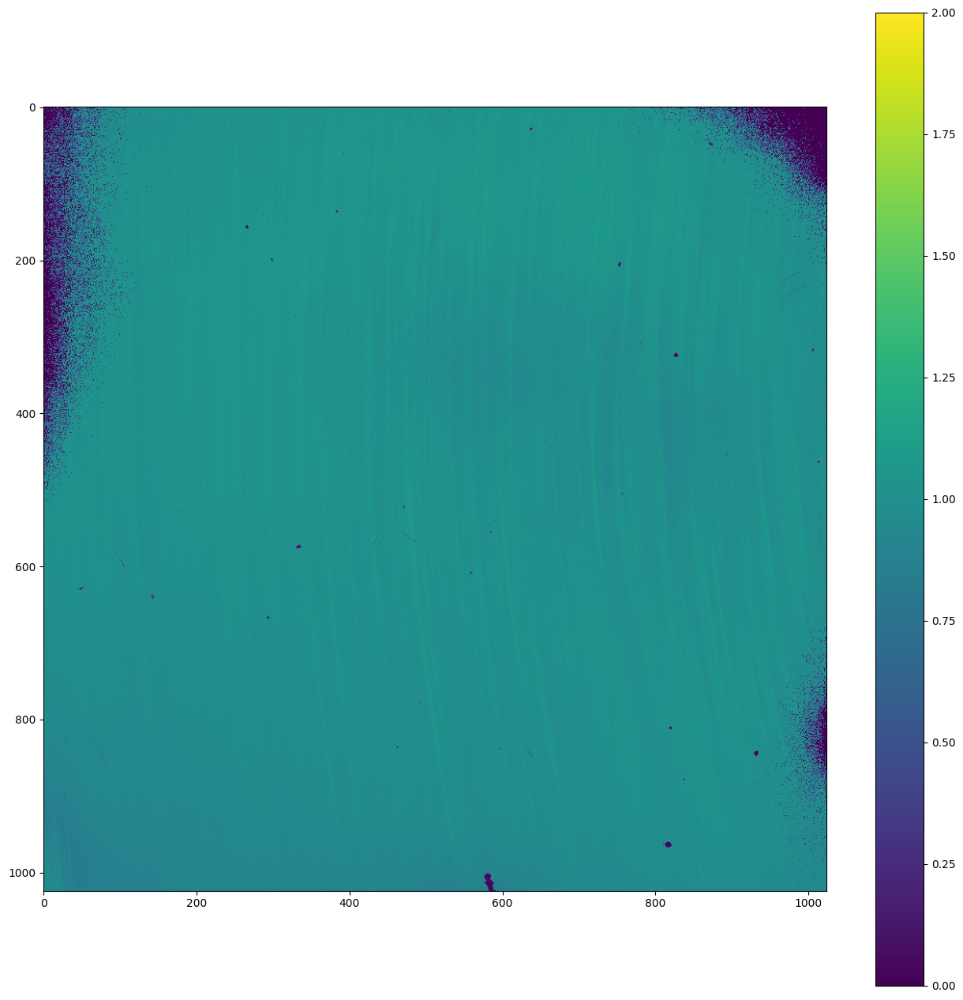

In [40]:
flats_cube_tmp=[]
for filename in filelist_flats:
    dummy = fits.open(filename)[0].data-masterflats_darks # subtrack dark frame from each flat
    flats_cube_tmp.append(dummy) # add up all of the flat fields

flats_cube = np.array(flats_cube_tmp)
masterflat = np.median(flats_cube,axis=0)
masterflat /= np.median(masterflat)
#fits.writeto(path_output+'masterflat.fits',masterflat,overwrite=True)
plt.figure(figsize=(16,16))
plt.imshow(masterflat,vmin=0,vmax=2) # mostly green (near 1.0)
plt.colorbar()

### Cold Pixel Map

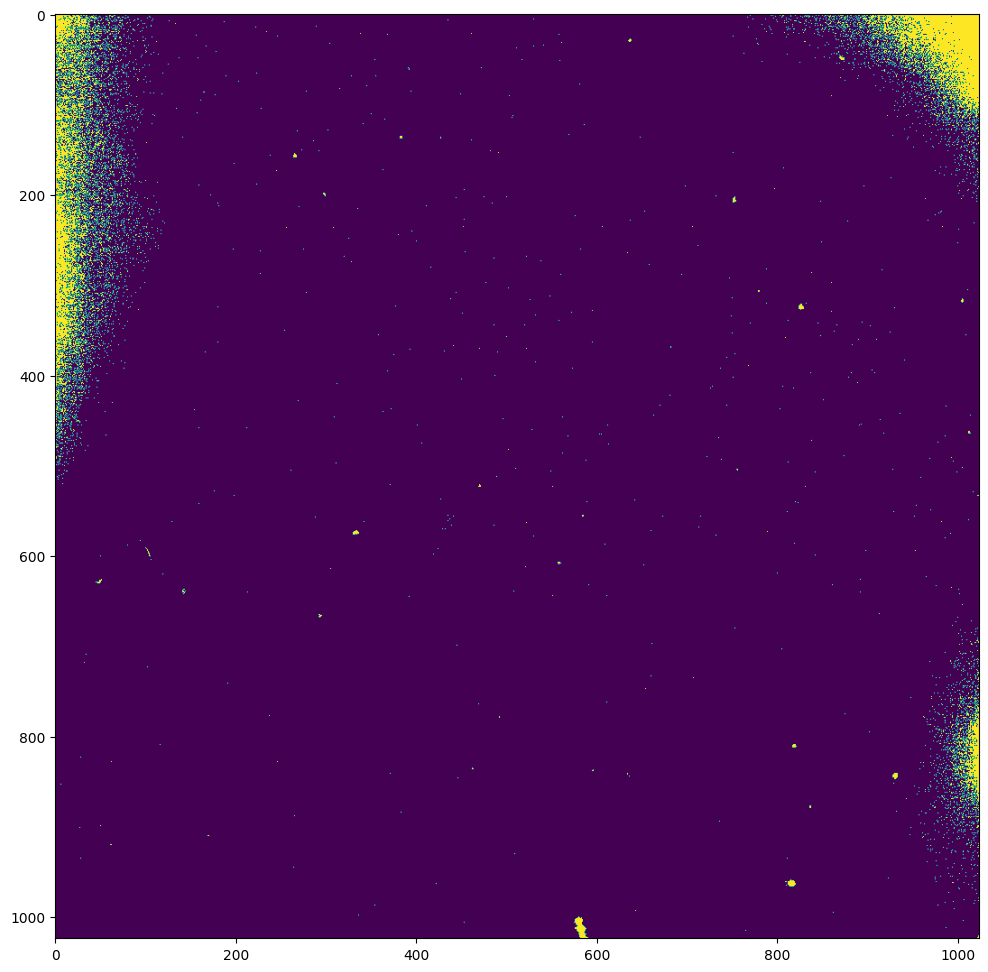

In [41]:
bpmap_cold = masterflat <= 0.7
plt.figure(figsize=(12,12))
plt.imshow(bpmap_cold)
#fits.writeto(path_output+'bpmap_cold.fits',1.*bpmap_cold,overwrite=True)


### Masrer Dark

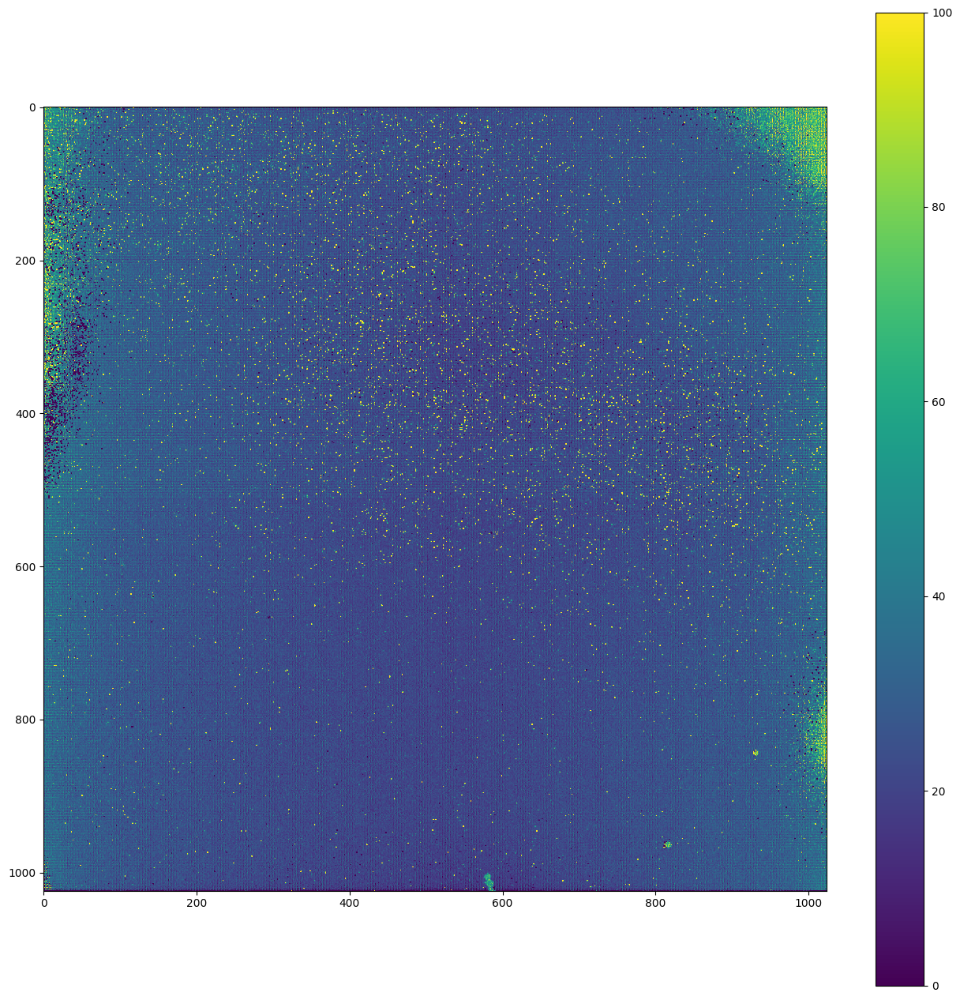

In [42]:
darks_cube_tmp=[]
for filename in filelist_darks:
    dummy = fits.open(filename)[0].data
    darks_cube_tmp.append(dummy)
kernel_size = 10
darks_cube = np.array(darks_cube_tmp)
masterdark = np.median(darks_cube,axis=0)
masterdark_median = median_filter(masterdark, kernel_size)
#fits.writeto(path_output+'masterdark.fits',masterdark,overwrite=True)
plt.figure(figsize=(16,16))
plt.imshow(masterdark,vmin=0,vmax=100) # can see hot pixels if we change the color bar
plt.colorbar()

### Hot Pixel Map

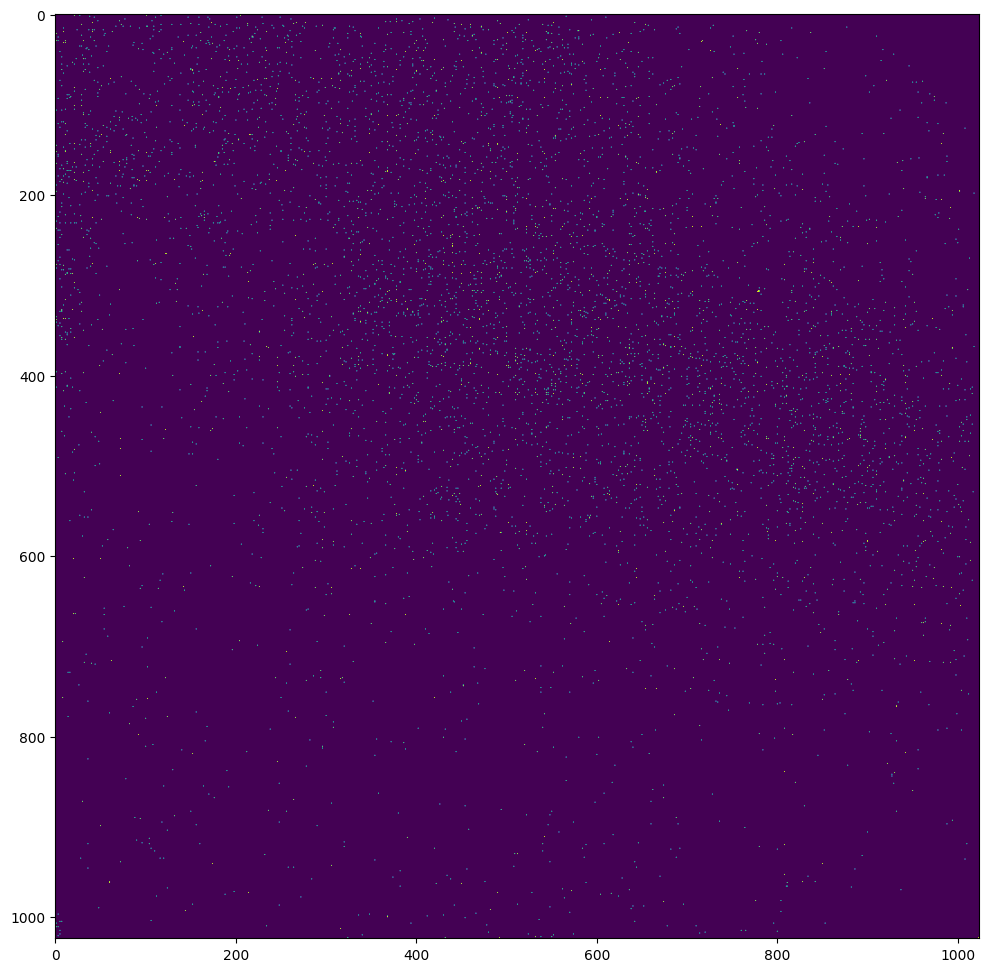

In [43]:
bpmap_hot = masterdark > 5*masterdark_median
plt.figure(figsize=(12,12))
#fits.writeto(path_output+'bpmap_hot.fits',1.*bpmap_hot,overwrite=True)
plt.imshow(bpmap_hot)

### Full Bad Pixel Map

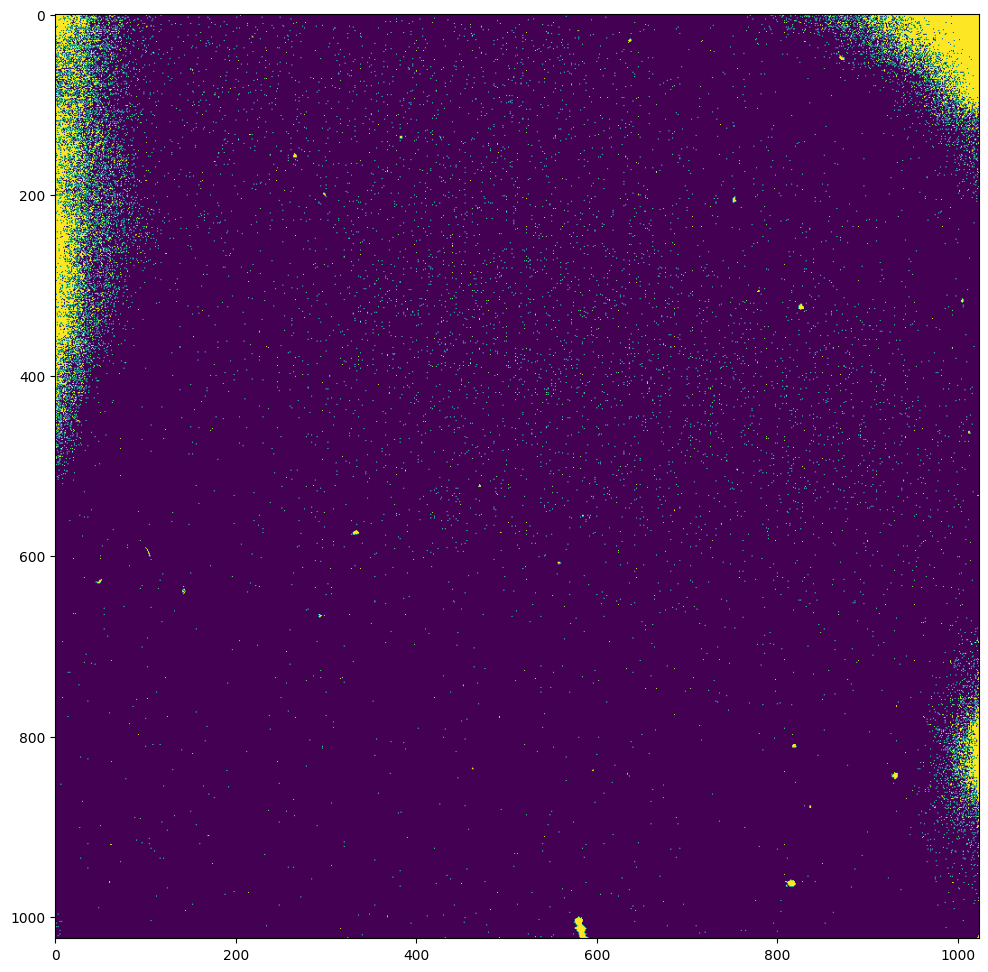

In [44]:
bpmap = bpmap_cold + bpmap_hot
plt.figure(figsize=(12,12))
plt.imshow(bpmap)
#fits.writeto(path_output+'bpmap.fits',1.*bpmap,overwrite=True)

### Registering 

In [45]:
sci_cube_tmp=[]
sci_header_tmp=[]
shiftx_tmp=[]
shifty_tmp=[]
for filename in filelist_sci:
    hdu = fits.open(filename)[0]
    sci_header_tmp.append(hdu.header)
    data = hdu.data
    data -= masterdark   # subtract master dark image
    data /= masterflat   # divide by master flat image
    sci_cube_tmp.append(data)
    shiftx_tmp.append(hdu.header['HIERARCH ESO SEQ CUMOFFSETX'])
    shifty_tmp.append(hdu.header['HIERARCH ESO SEQ CUMOFFSETY'])

/tmp/ipykernel_12255/2616575555.py:10: RuntimeWarning: divide by zero encountered in divide
  data /= masterflat   # divide by master flat image


### Sky Map

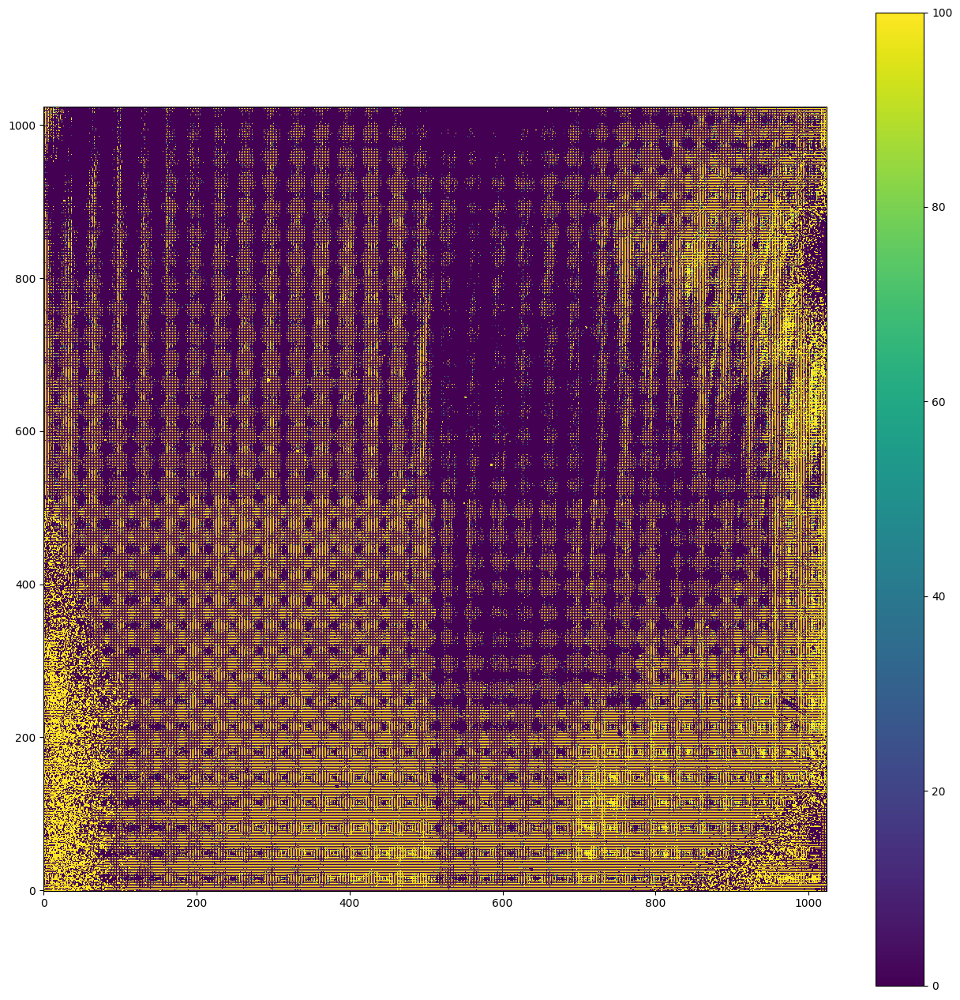

In [93]:
sci_cube = np.array(sci_cube_tmp)
sky = np.median(sci_cube,axis=0)
plt.figure(figsize=(16,16))
plt.imshow(sky,vmin=0,vmax=100, origin = 'lower')
plt.colorbar()

### Subtracting sky background from the science frames and replace bad pixels

In [94]:
kernel_size = 3
for i in range(sci_cube.shape[0]):
    dummy = sci_cube[i,:,:]
    dummy -= sky
    dummy_median = median_filter(dummy,kernel_size)
    dummy[np.where(bpmap == True)]=dummy_median[np.where(bpmap == True)] # replace bad pixels from median of local pix
    sci_cube[i,:,:] = median_filter(dummy,kernel_size)
    #plt.figure(figsize=(16,16)) # note clean images!
    #plt.imshow(dummy,vmin=0,vmax=100)

/tmp/ipykernel_12255/2820620917.py:4: RuntimeWarning: invalid value encountered in subtract
  dummy -= sky


In [95]:
bad_image = []
for i in sci_cube:
    bad_image.append(np.nanmedian(i) < 1)

/tmp/ipykernel_12255/3135458183.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(16,16)) # note clean images!


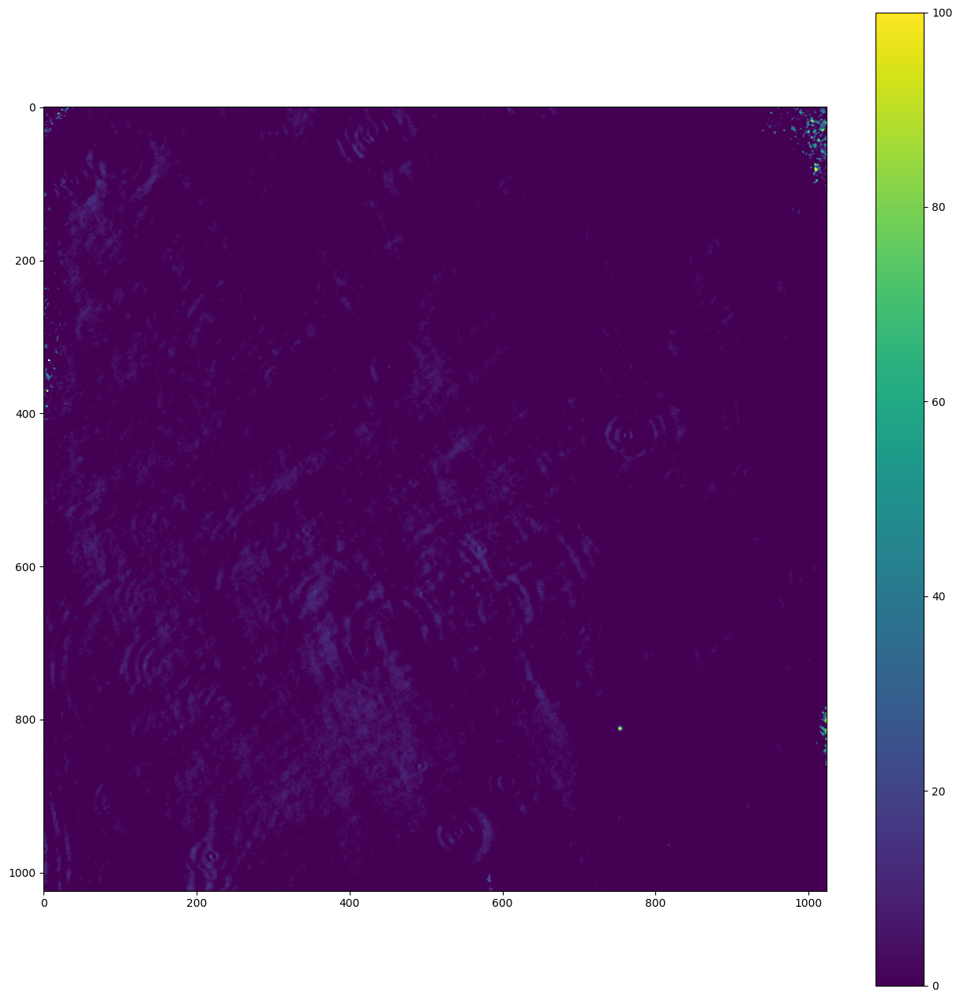

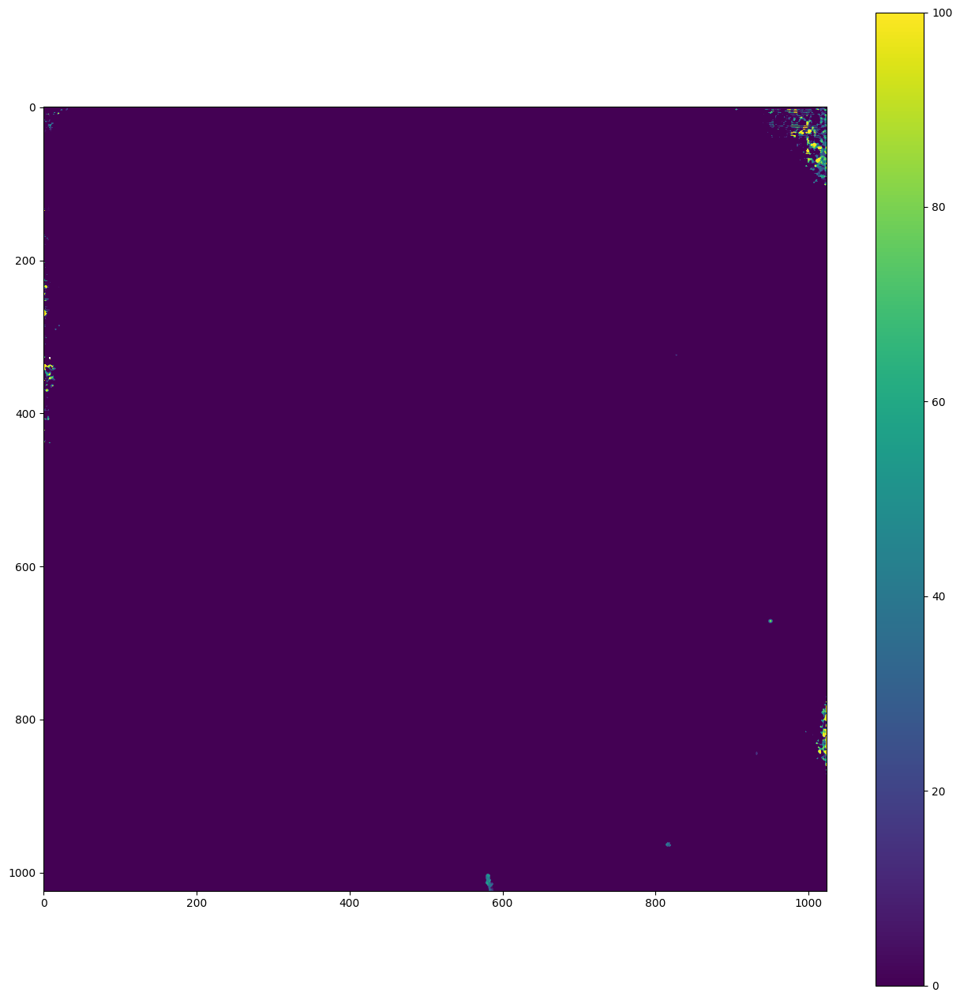

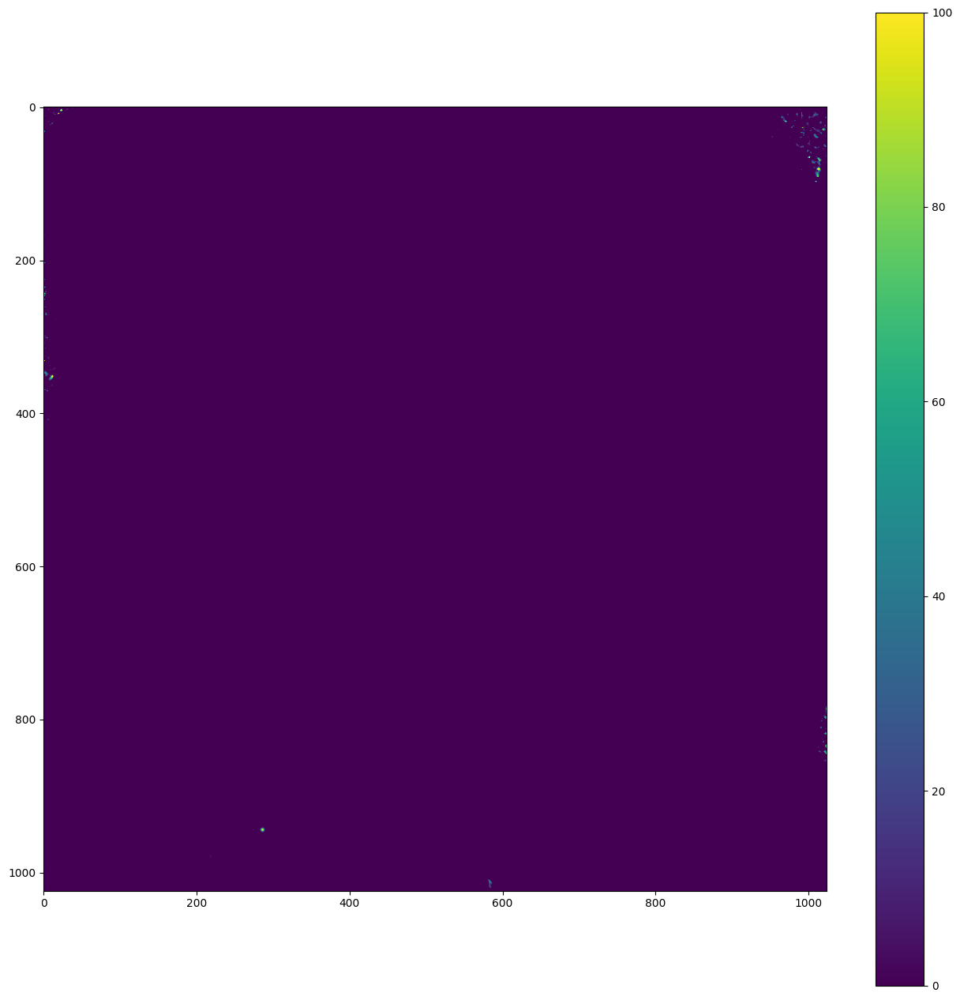

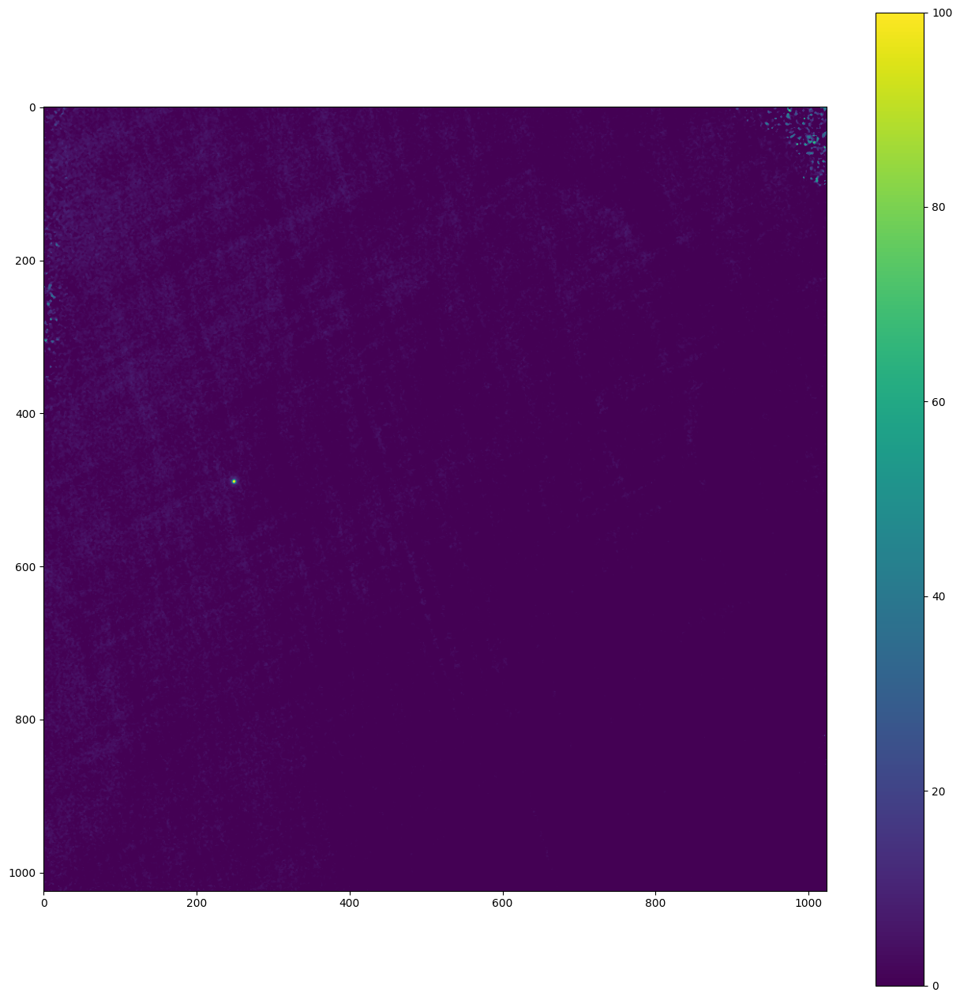

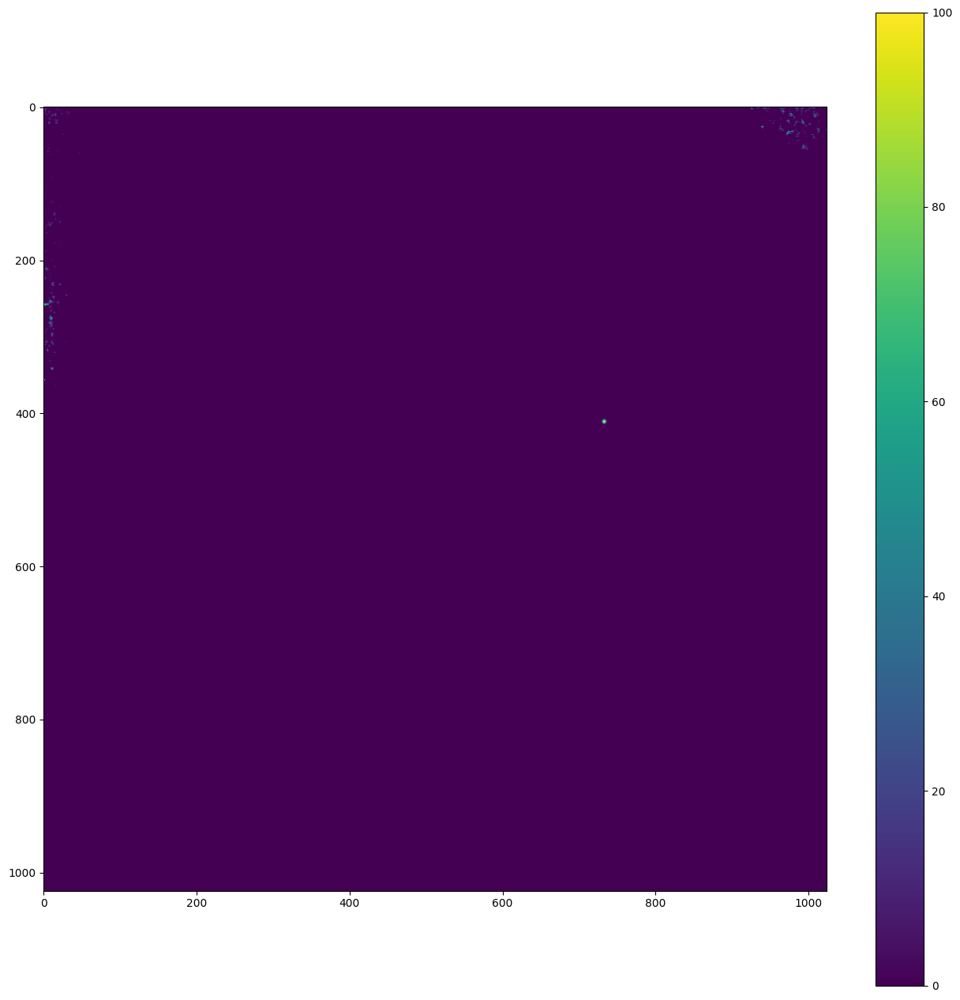

...

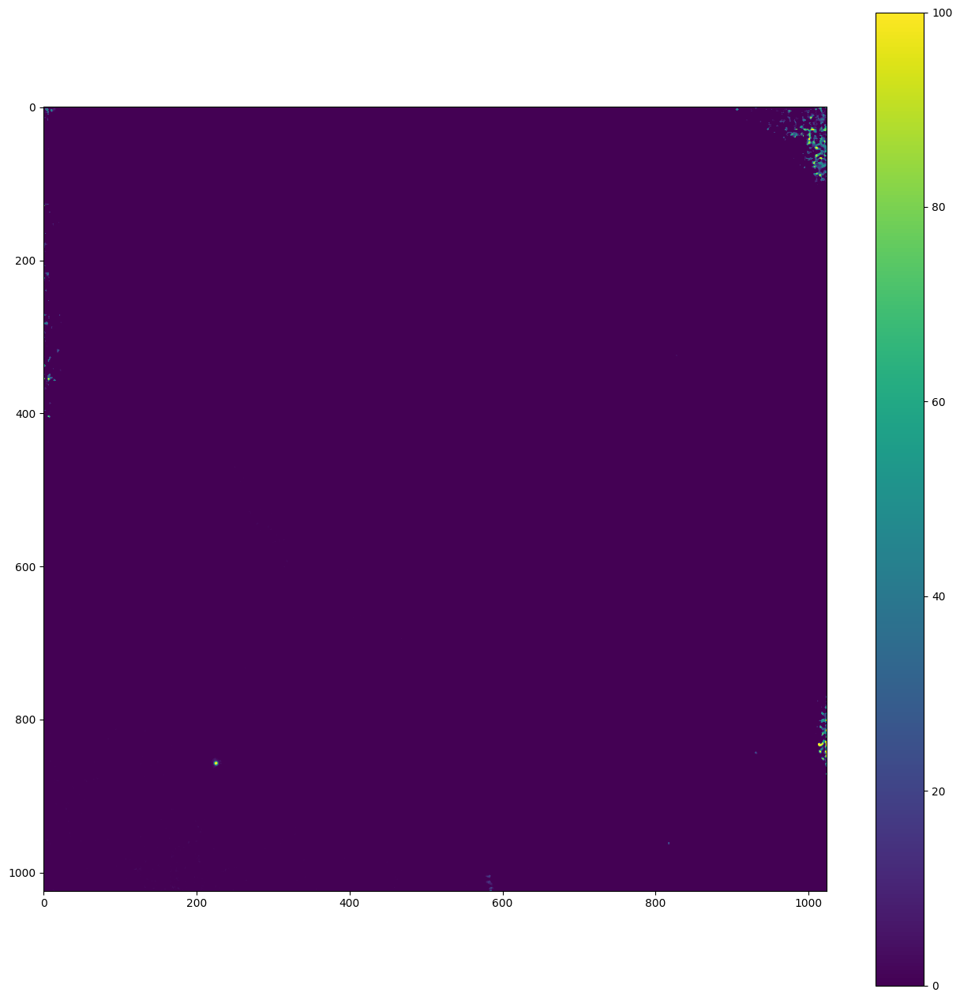

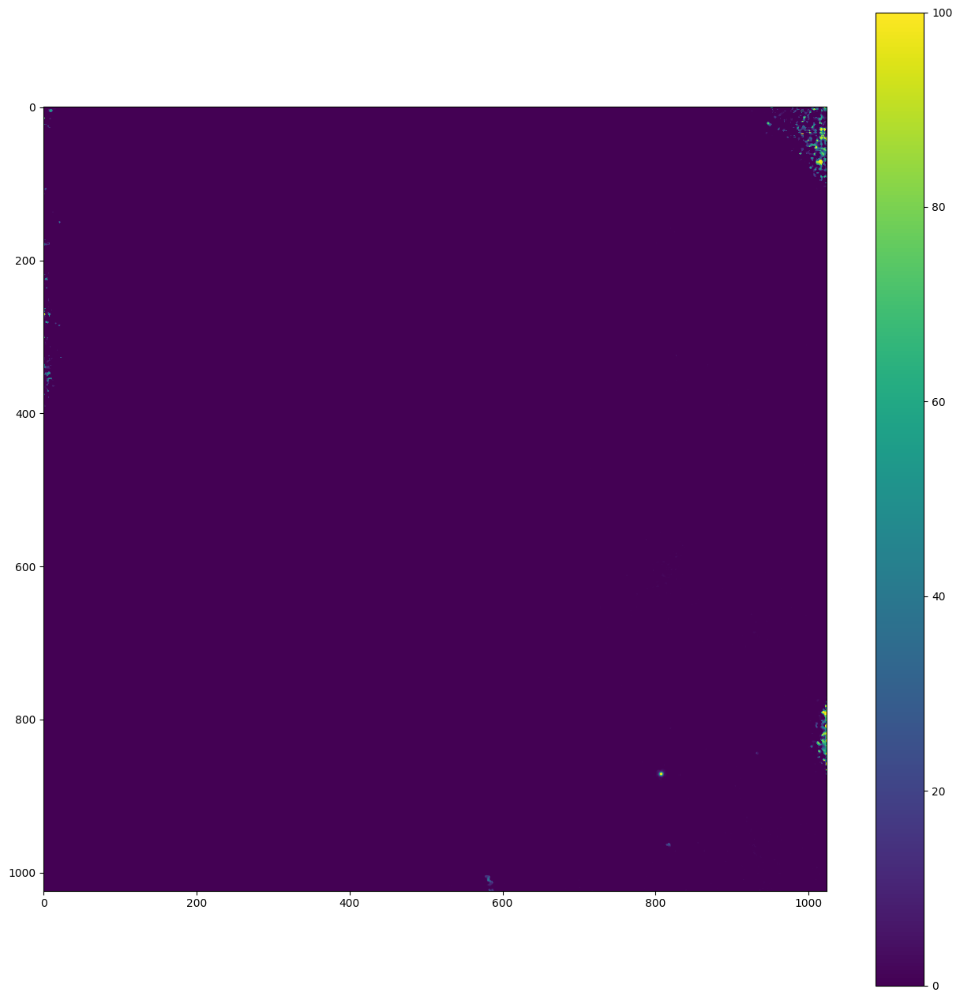

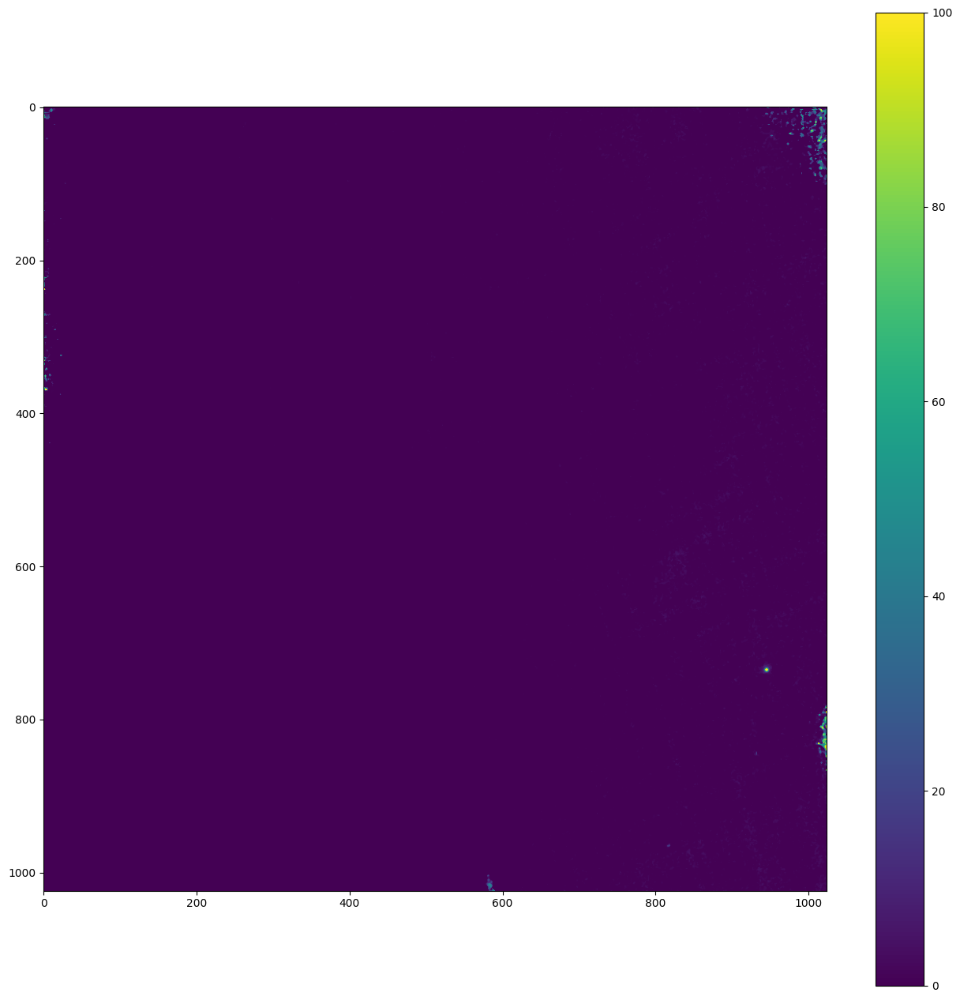

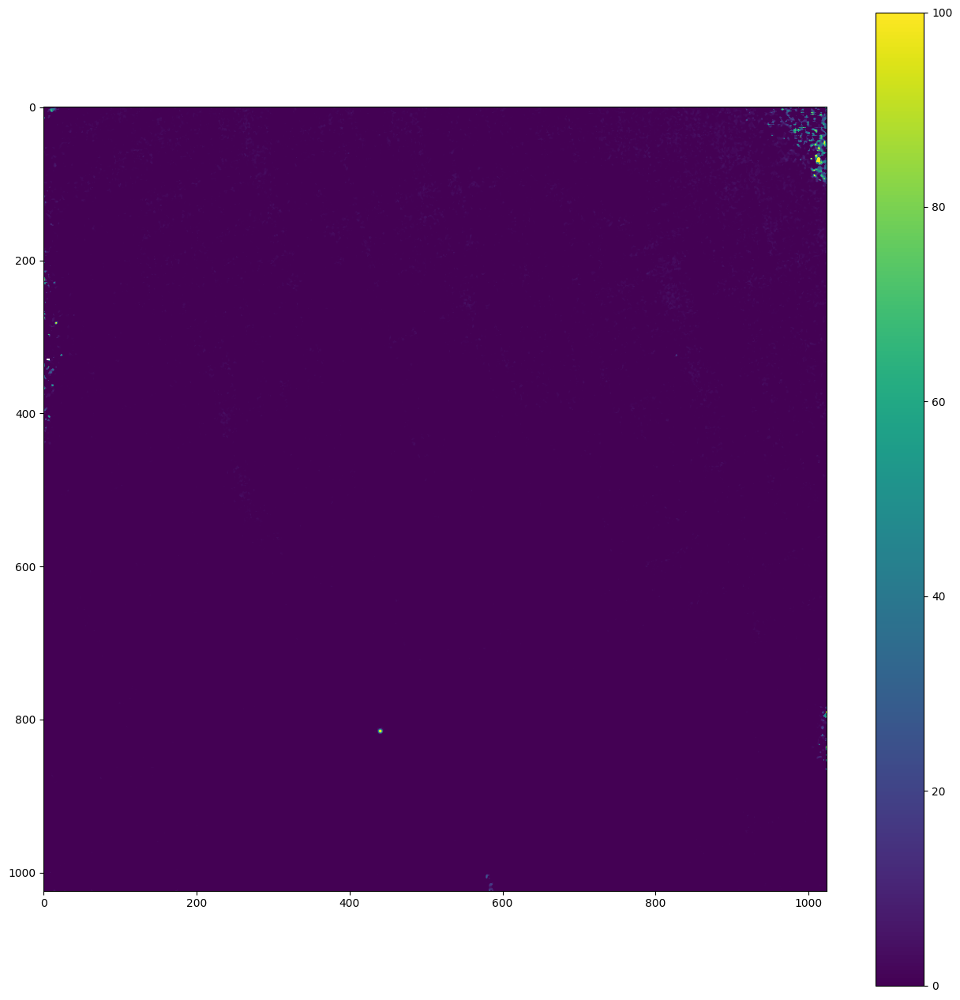

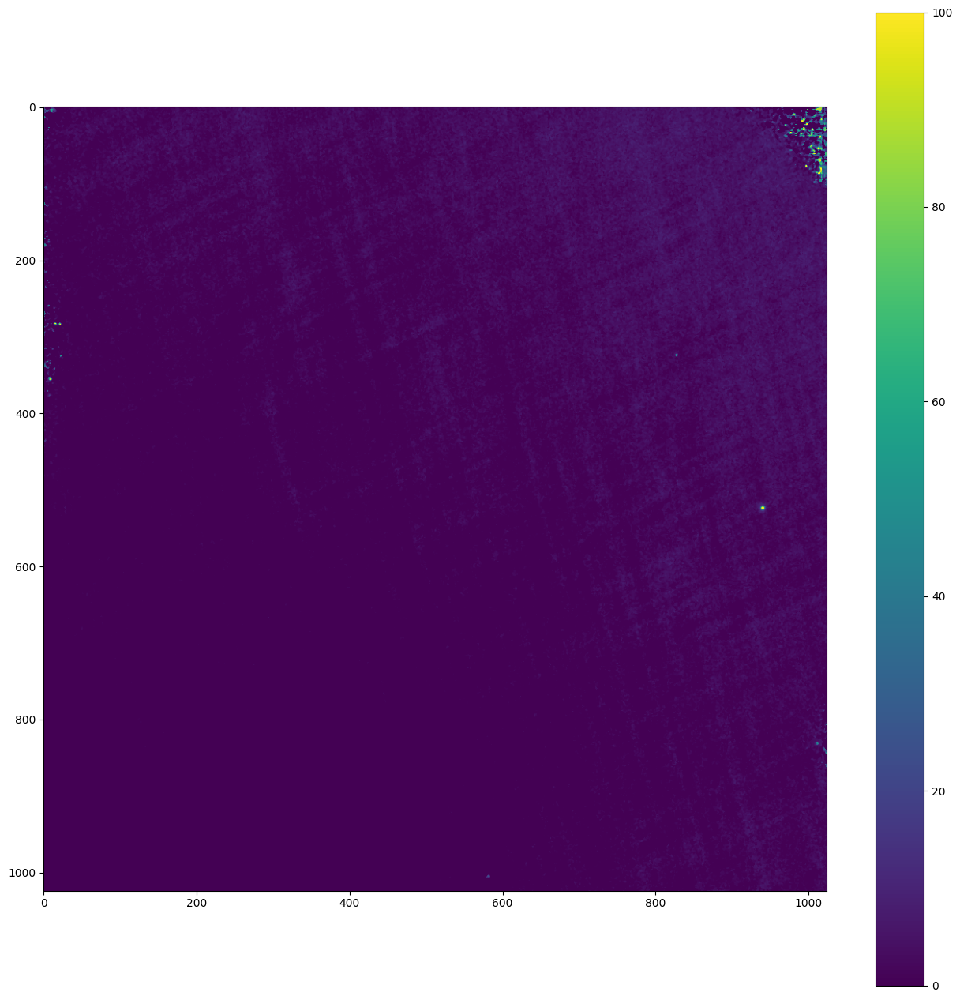

In [96]:
for i in sci_cube[bad_image]:
    plt.figure(figsize=(16,16)) # note clean images!
    plt.imshow(i,vmin=0,vmax=100)
    plt.colorbar()

In [101]:
sci_cube = sci_cube[bad_image]

In [102]:
sci_cube.shape
crop = 768
dimx = sci_cube.shape[1]
dimy = sci_cube.shape[2]
x1 = int((sci_cube.shape[1] - crop)/2)
x2 = int(x1 + crop)
y1 = int((sci_cube.shape[2] - crop)/2)
y2 = int(y1 + crop)
sci_cube_cropped = sci_cube[:,x1:x2,y1:y2]
sci_cube_cropped.shape

(23, 768, 768)

In [103]:
len(sci_cube)

23

### Shifting

In [104]:
sci_cube_shifted = np.copy(sci_cube_cropped)
for i in range(len(sci_cube)):
    dummy = sci_cube_cropped[i,:,:]
    print(shiftx_tmp[i],shifty_tmp[i])
    sci_cube_shifted[i,:,:] = shift(dummy,[-shifty_tmp[i],-shiftx_tmp[i]], order=1)

sci_cube_shiftedb = np.copy(sci_cube_shifted)

-159.0 181.0
-285.0 -26.0
49.0 -189.0
241.0 -119.0
333.0 -335.0
162.0 236.0
-352.0 -206.0
356.0 97.0
-298.0 366.0
0.0 0.0
-199.0 -267.0
15.0 -349.0
53.0 279.0
332.0 290.0
-190.0 67.0
353.0 -22.0
-281.0 361.0
258.0 -314.0
-333.0 -86.0
144.0 -163.0
115.0 49.0
-260.0 -314.0
-56.0 -212.0


In [105]:
cx=int(crop/2)
cy=int(crop/2)
for i in range(len(sci_cube)):
    dummy = sci_cube_shiftedb[i,:,:]
    max_coord = np.unravel_index(np.argmax(dummy, axis=None), dummy.shape)
    print(np.unravel_index(np.argmax(dummy, axis=None), dummy.shape))
    shiftx = cx-max_coord[0]
    shifty = cy-max_coord[1]
    print(shiftx,shifty)
    sci_cube_shiftedb[i,:,:] = shift(dummy,[shiftx,shifty], order=1)

(267, 599)
117 -215
(478, 733)
-94 -349
(0, 0)
384 384
(190, 65)
194 319
(617, 271)
-233 113
(260, 413)
124 -29
(337, 546)
47 -162
(136, 45)
248 339
(0, 0)
384 384
(718, 745)
-334 -361
(681, 541)
-297 -157
(658, 467)
-274 -83
(167, 152)
217 232
(290, 46)
94 338
(227, 288)
157 96
(463, 202)
-79 182
(388, 536)
-4 -152
(534, 163)
-150 221
(501, 484)
-117 -100
(359, 554)
25 -170
(383, 620)
1 -236
(401, 356)
-17 28
(407, 754)
-23 -370


### Creating New Image Files

In [106]:
final_image = np.median(sci_cube_shiftedb[0:3,:,:],axis=0)
#fits.writeto(path_output+'test2.fits',sci_cube_shiftedb,overwrite=True)

#fits.writeto(path_output+'final_image.fits',final_image,overwrite=True)

### Final Image

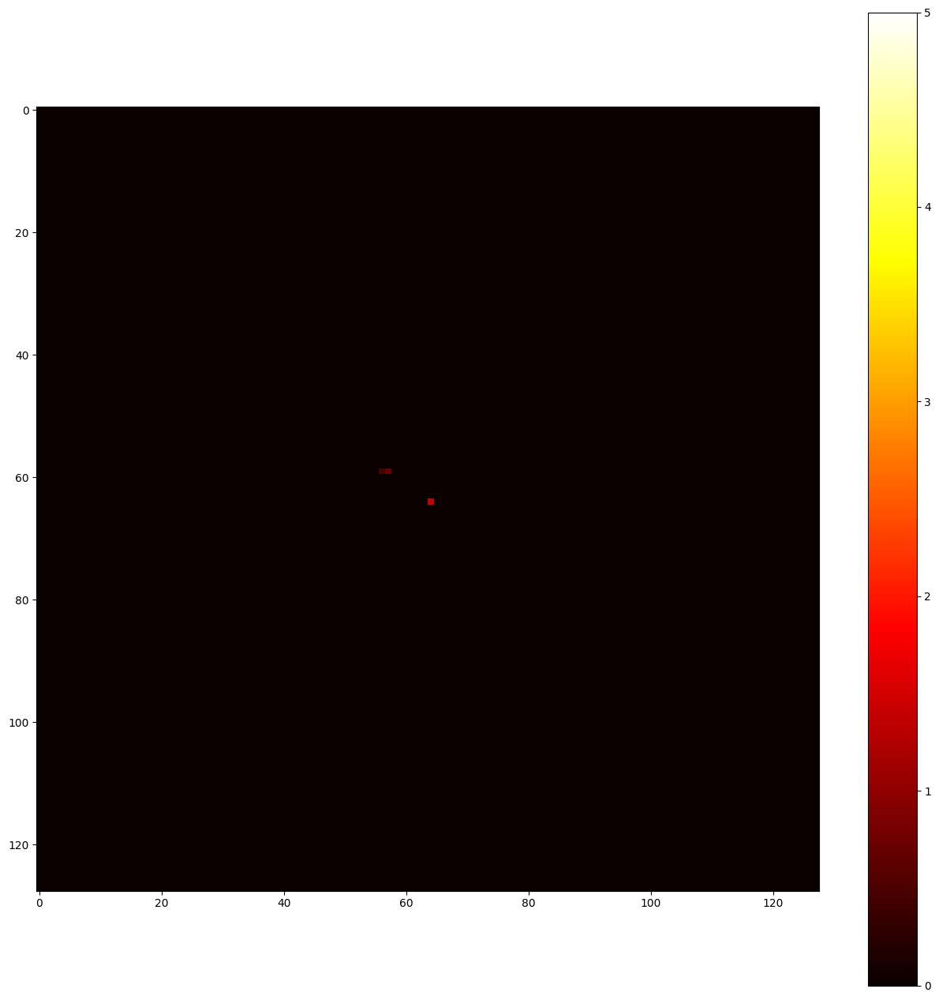

In [107]:
crop = 128
dimx = final_image.shape[0]
dimy = final_image.shape[1]
x1 = int((dimx - crop)/2)
x2 = int(x1 + crop)
y1 = int((dimy - crop)/2)
y2 = int(y1 + crop)
final_image_cropped = final_image[x1:x2,y1:y2]
final_image_cropped.shape

plt.figure(figsize=(16,16))
plt.imshow(final_image_cropped,vmin=0,vmax=5,cmap='hot')
plt.colorbar()

### Identifying Sources Using Photoutils

In [111]:
from photutils import DAOStarFinder
from astropy.stats import mad_std
bkg_sigma = mad_std(final_image_cropped)
daofind = DAOStarFinder(fwhm=4,threshold=12*bkg_sigma)  
sources = daofind(final_image_cropped)
for col in sources.colnames:
    sources[col].info.format = '%.8g'
print(sources)

 id xcentroid ycentroid sharpness   roundness1 ... sky     peak    flux mag 
--- --------- --------- ---------- ----------- ... --- ----------- ---- ----
  1 79.342715 2.6193612 0.30444046 -0.98122871 ...   0           0  inf -inf
  2  95.84468 2.4082301 0.38946212 -0.77445924 ...   0           0  inf -inf
  3 6.2915732 4.7497404 0.49468315  0.56465727 ...   0           0  inf -inf
  4 88.992581 3.8603748 0.26994291  0.78619045 ...   0 -0.61962891  inf -inf
  5 10.404611 10.163021 0.29526754 -0.25588611 ...   0  -1.8926382  inf -inf
  6 17.227002  8.744388 0.40690946  0.36587793 ...   0           0  inf -inf
  7 82.375822 9.5203441 0.47849235 -0.96360672 ...   0 -0.55065918  inf -inf
  8 90.344912 10.836913 0.22573097 -0.57833928 ...   0      -0.625  inf -inf
  9 6.2040025 11.213185 0.35894171 -0.97760546 ...   0           0  inf -inf
 10 79.612984 11.043951 0.41177701 -0.64170009 ...   0    -1.02771  inf -inf
...       ...       ...        ...         ... ... ...         ...  ...  ...

/tmp/ipykernel_12255/3988767269.py:1: DeprecationWarning: `photutils.DAOStarFinder` is a deprecated alias for `photutils.detection.DAOStarFinder` and will be removed in the future. Instead, please use `from photutils.detection import DAOStarFinder` to silence this warning.
  from photutils import DAOStarFinder
/home/hallflower/anaconda3/envs/imaging/lib/python3.10/site-packages/photutils/detection/daofinder.py:640: RuntimeWarning: divide by zero encountered in divide
  return ((self.convdata_peak / self.threshold_eff)


In [109]:
from photutils import aperture_photometry, CircularAperture
positions = np.transpose((sources['xcentroid'], sources['ycentroid']))
apertures = CircularAperture(positions, r=4.)
phot_table = aperture_photometry(final_image_cropped, apertures)
for col in phot_table.colnames:
    phot_table[col].info.format = '%.8g'
print(phot_table)

 id  xcenter   ycenter  aperture_sum
       pix       pix                
--- --------- --------- ------------
  1 79.342715 2.6193612   -6.2901528
  2  95.84468 2.4082301   -24.641733
  3 6.2915732 4.7497404   -47.758674
  4 88.992581 3.8603748   -20.434536
  5 10.404611 10.163021   -102.29963
  6 17.227002  8.744388    -39.52465
  7 82.375822 9.5203441   -76.991482
  8 90.344912 10.836913   -53.712652
  9 6.2040025 11.213185   -23.959708
...       ...       ...          ...
104 88.179366 118.12984   -18.215931
105 33.750337 119.77102   -85.104565
106 51.869375 118.86445    -139.8257
107 20.995424 121.60004    -242.6817
108 44.285254 124.23603   -404.03749
109 50.267122 123.90658   -265.85824
110 61.067179 125.58975   -24.005577
111 81.998989 124.42054   -38.579723
112 92.004854 122.71617   -33.404072
113 67.544905 127.32781   -27.678987
Length = 113 rows


/tmp/ipykernel_12255/1164561592.py:1: DeprecationWarning: `photutils.aperture_photometry` is a deprecated alias for `photutils.aperture.aperture_photometry` and will be removed in the future. Instead, please use `from photutils.aperture import aperture_photometry` to silence this warning.
  from photutils import aperture_photometry, CircularAperture
/tmp/ipykernel_12255/1164561592.py:1: DeprecationWarning: `photutils.CircularAperture` is a deprecated alias for `photutils.aperture.CircularAperture` and will be removed in the future. Instead, please use `from photutils.aperture import CircularAperture` to silence this warning.
  from photutils import aperture_photometry, CircularAperture


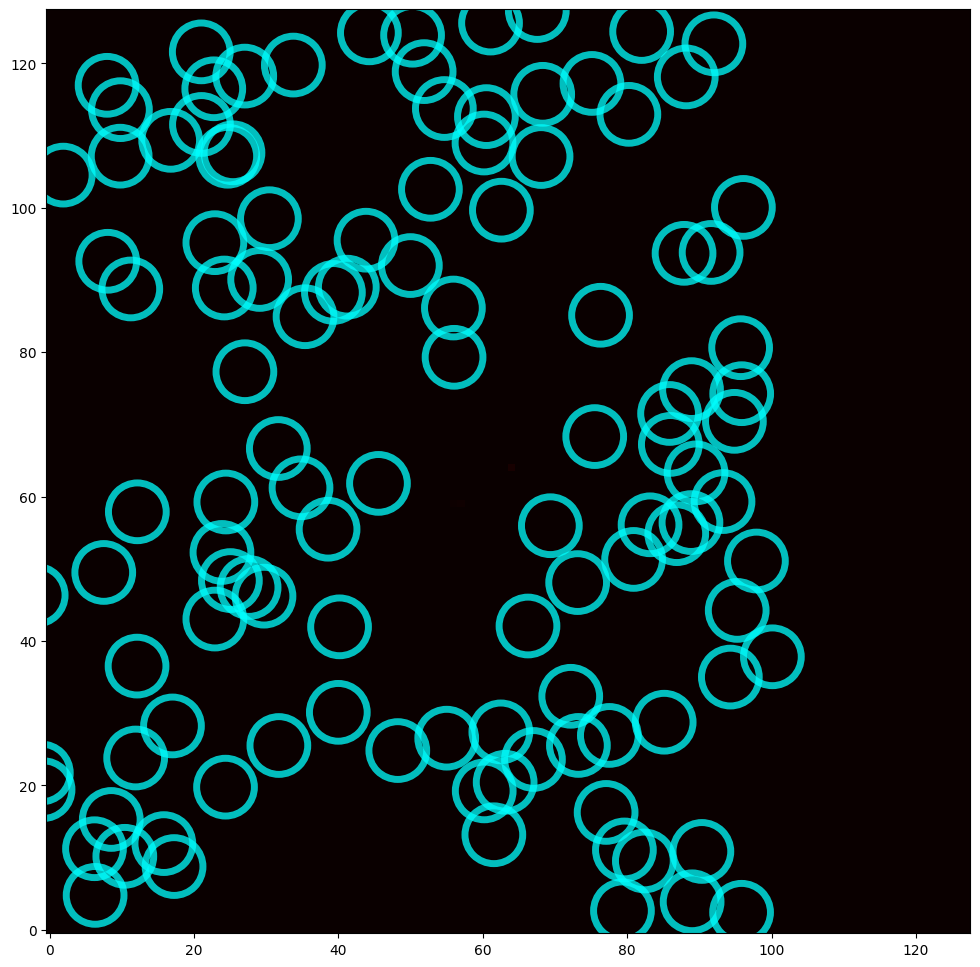

In [110]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12,12))
plt.imshow(final_image_cropped,vmin=0,vmax=60,cmap='hot',origin='lower')
apertures.plot(color='cyan',lw=5,alpha=0.75)

### Flux Ratio & Magnitude

In [56]:
flux_ratio = 16725.869 / 192.28016
print('Flux Ratio:',flux_ratio)

mag_difference = 2.5*np.log10(flux_ratio)
print('Magnitude Difference:',mag_difference)

Flux Ratio: 86.98697255088616
Magnitude Difference: 4.848635540371155


In [57]:
# Brown Dwarf 2M1207 has H = 11.945
k_mag_brown_dwarf = 11.945
k_mag_planet = k_mag_brown_dwarf + mag_difference
print('H Band Planet Mag:',k_mag_planet)


H Band Planet Mag: 16.793635540371156
